In [151]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
# Getting needed libraries
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

pd.set_option('display.max_rows', 999)

# 1. Data Import

In [0]:
df_input = pd.read_csv('/content/drive/My Drive/InputFiles/Assignment_AdvancedRegression/train.csv')

In [154]:
df_input.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,...,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,...,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,...,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,...,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,...,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,...,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [155]:
# checking the dimensions of the data
df_input.shape

(1460, 81)

In [156]:
df_input.Id.nunique()

1460

# 2. Data Cleaning

In [0]:
# Id column represents nothing but Index value; so, removing
df_input.drop('Id', axis = 1, inplace = True)

In [158]:
# checking the data type definition
df_input.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 80 columns):
MSSubClass       1460 non-null int64
MSZoning         1460 non-null object
LotFrontage      1201 non-null float64
LotArea          1460 non-null int64
Street           1460 non-null object
Alley            91 non-null object
LotShape         1460 non-null object
LandContour      1460 non-null object
Utilities        1460 non-null object
LotConfig        1460 non-null object
LandSlope        1460 non-null object
Neighborhood     1460 non-null object
Condition1       1460 non-null object
Condition2       1460 non-null object
BldgType         1460 non-null object
HouseStyle       1460 non-null object
OverallQual      1460 non-null int64
OverallCond      1460 non-null int64
YearBuilt        1460 non-null int64
YearRemodAdd     1460 non-null int64
RoofStyle        1460 non-null object
RoofMatl         1460 non-null object
Exterior1st      1460 non-null object
Exterior2nd      1460 non-

In [159]:
# Checking NULL value percentage distribution
round(df_input.isna().sum() / df_input.shape[0] * 100, 2)

MSSubClass        0.00
MSZoning          0.00
LotFrontage      17.74
LotArea           0.00
Street            0.00
Alley            93.77
LotShape          0.00
LandContour       0.00
Utilities         0.00
LotConfig         0.00
LandSlope         0.00
Neighborhood      0.00
Condition1        0.00
Condition2        0.00
BldgType          0.00
HouseStyle        0.00
OverallQual       0.00
OverallCond       0.00
YearBuilt         0.00
YearRemodAdd      0.00
RoofStyle         0.00
RoofMatl          0.00
Exterior1st       0.00
Exterior2nd       0.00
MasVnrType        0.55
MasVnrArea        0.55
ExterQual         0.00
ExterCond         0.00
Foundation        0.00
BsmtQual          2.53
BsmtCond          2.53
BsmtExposure      2.60
BsmtFinType1      2.53
BsmtFinSF1        0.00
BsmtFinType2      2.60
BsmtFinSF2        0.00
BsmtUnfSF         0.00
TotalBsmtSF       0.00
Heating           0.00
HeatingQC         0.00
CentralAir        0.00
Electrical        0.07
1stFlrSF          0.00
2ndFlrSF   

In [0]:
# Removing the columns having more than 40% of the data.
colsNeeding = list(set(df_input.columns) - set(['Alley', 'FireplaceQu', 'PoolQC', 'Fence', 'MiscFeature']))

In [161]:
# Getting rid-off unwanted columns
df_input = df_input[colsNeeding]
df_input.head()

,LandSlope,OpenPorchSF,ExterQual,BsmtHalfBath,Condition2,Fireplaces,BsmtExposure,Heating,EnclosedPorch,BsmtFullBath,GarageFinish,GarageType,LowQualFinSF,FullBath,Condition1,BsmtFinSF2,2ndFlrSF,GarageYrBlt,SaleCondition,HeatingQC,ExterCond,ScreenPorch,BedroomAbvGr,MSSubClass,BsmtFinSF1,GarageArea,LotShape,LotConfig,BsmtCond,GarageCars,RoofMatl,PavedDrive,Exterior1st,MoSold,GarageCond,OverallCond,YrSold,GarageQual,Electrical,Foundation,HouseStyle,KitchenAbvGr,BsmtFinType1,TotalBsmtSF,CentralAir,MasVnrType,MasVnrArea,Functional,3SsnPorch,LandContour,BldgType,SalePrice,MiscVal,YearBuilt,RoofStyle,BsmtFinType2,GrLivArea,Utilities,Exterior2nd,LotArea,SaleType,WoodDeckSF,BsmtQual,MSZoning,OverallQual,TotRmsAbvGrd,HalfBath,KitchenQual,1stFlrSF,LotFrontage,Neighborhood,PoolArea,BsmtUnfSF,YearRemodAdd,Street
0,Gtl,61,Gd,0,Norm,0,No,GasA,0,1,RFn,Attchd,0,2,Norm,0,854,2003.0,Normal,Ex,TA,0,3,60,706,548,Reg,Inside,TA,2,CompShg,Y,VinylSd,2,TA,5,2008,TA,SBrkr,PConc,2Story,1,GLQ,856,Y,BrkFace,196.0,Typ,0,Lvl,1Fam,208500,0,2003,Gable,Unf,1710,AllPub,VinylSd,8450,WD,0,Gd,RL,7,8,1,Gd,856,65.0,CollgCr,0,150,2003,Pave
1,Gtl,0,TA,1,Norm,1,Gd,GasA,0,0,RFn,Attchd,0,2,Feedr,0,0,1976.0,Normal,Ex,TA,0,3,20,978,460,Reg,FR2,TA,2,CompShg,Y,MetalSd,5,TA,8,2007,TA,SBrkr,CBlock,1Story,1,ALQ,1262,Y,None,0.0,Typ,0,Lvl,1Fam,181500,0,1976,Gable,Unf,1262,AllPub,MetalSd,9600,WD,298,Gd,RL,6,6,0,TA,1262,80.0,Veenker,0,284,1976,Pave
2,Gtl,42,Gd,0,Norm,1,Mn,GasA,0,1,RFn,Attchd,0,2,Norm,0,866,2001.0,Normal,Ex,TA,0,3,60,486,608,IR1,Inside,TA,2,CompShg,Y,VinylSd,9,TA,5,2008,TA,SBrkr,PConc,2Story,1,GLQ,920,Y,BrkFace,162.0,Typ,0,Lvl,1Fam,223500,0,2001,Gable,Unf,1786,AllPub,VinylSd,11250,WD,0,Gd,RL,7,6,1,Gd,920,68.0,CollgCr,0,434,2002,Pave
3,Gtl,35,TA,0,Norm,1,No,GasA,272,1,Unf,Detchd,0,1,Norm,0,756,1998.0,Abnorml,Gd,TA,0,3,70,216,642,IR1,Corner,Gd,3,CompShg,Y,Wd Sdng,2,TA,5,2006,TA,SBrkr,BrkTil,2Story,1,ALQ,756,Y,None,0.0,Typ,0,Lvl,1Fam,140000,0,1915,Gable,Unf,1717,AllPub,Wd Shng,9550,WD,0,TA,RL,7,7,0,Gd,961,60.0,Crawfor,0,540,1970,Pave
4,Gtl,84,Gd,0,Norm,1,Av,GasA,0,1,RFn,Attchd,0,2,Norm,0,1053,2000.0,Normal,Ex,TA,0,4,60,655,836,IR1,FR2,TA,3,CompShg,Y,VinylSd,12,TA,5,2008,TA,SBrkr,PConc,2Story,1,GLQ,1145,Y,BrkFace,350.0,Typ,0,Lvl,1Fam,250000,0,2000,Gable,Unf,2198,AllPub,VinylSd,14260,WD,192,Gd,RL,8,9,1,Gd,1145,84.0,NoRidge,0,490,2000,Pave


In [0]:
# Dropping the remaining null values
df_input.dropna(inplace = True)

In [163]:
# Checking again NULL value percentage distribution
round(df_input.isna().sum() / df_input.shape[0] * 100, 2)

LandSlope        0.0
OpenPorchSF      0.0
ExterQual        0.0
BsmtHalfBath     0.0
Condition2       0.0
Fireplaces       0.0
BsmtExposure     0.0
Heating          0.0
EnclosedPorch    0.0
BsmtFullBath     0.0
GarageFinish     0.0
GarageType       0.0
LowQualFinSF     0.0
FullBath         0.0
Condition1       0.0
BsmtFinSF2       0.0
2ndFlrSF         0.0
GarageYrBlt      0.0
SaleCondition    0.0
HeatingQC        0.0
ExterCond        0.0
ScreenPorch      0.0
BedroomAbvGr     0.0
MSSubClass       0.0
BsmtFinSF1       0.0
GarageArea       0.0
LotShape         0.0
LotConfig        0.0
BsmtCond         0.0
GarageCars       0.0
RoofMatl         0.0
PavedDrive       0.0
Exterior1st      0.0
MoSold           0.0
GarageCond       0.0
OverallCond      0.0
YrSold           0.0
GarageQual       0.0
Electrical       0.0
Foundation       0.0
HouseStyle       0.0
KitchenAbvGr     0.0
BsmtFinType1     0.0
TotalBsmtSF      0.0
CentralAir       0.0
MasVnrType       0.0
MasVnrArea       0.0
Functional   

{'boxes': [<matplotlib.lines.Line2D at 0x7f615514ad30>],
 'caps': [<matplotlib.lines.Line2D at 0x7f614df89ba8>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f614e0fb5f8>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f614de76eb8>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f614e35c438>,
  <matplotlib.lines.Line2D at 0x7f614fbe9470>]}

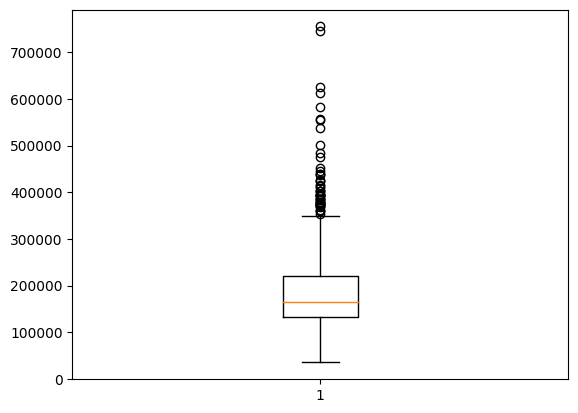

In [164]:
# Checking SalePrice Outlier values
plt.style.use('default')
plt.boxplot(df_input['SalePrice'])

In [165]:
df_input['SalePrice'].describe(percentiles = [.75, .90, .95, .97, .98, .99])

count      1094.000000
mean     187033.263254
std       83165.332151
min       35311.000000
50%      165750.000000
75%      221000.000000
90%      290000.000000
95%      343467.950000
97%      385000.000000
98%      403980.000000
99%      453563.500000
max      755000.000000
Name: SalePrice, dtype: float64

In [0]:
# removing salePrice Outliers 
df_input = df_input.loc[df_input['SalePrice'] <=  df_input['SalePrice'].quantile(.99)]

In [167]:
# Checking numericall value distribution
df_input.describe()

,OpenPorchSF,BsmtHalfBath,Fireplaces,EnclosedPorch,BsmtFullBath,LowQualFinSF,FullBath,BsmtFinSF2,2ndFlrSF,GarageYrBlt,ScreenPorch,BedroomAbvGr,MSSubClass,BsmtFinSF1,GarageArea,GarageCars,MoSold,OverallCond,YrSold,KitchenAbvGr,TotalBsmtSF,MasVnrArea,3SsnPorch,SalePrice,MiscVal,YearBuilt,GrLivArea,LotArea,WoodDeckSF,OverallQual,TotRmsAbvGrd,HalfBath,1stFlrSF,LotFrontage,PoolArea,BsmtUnfSF,YearRemodAdd
count,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000,1083.000000
mean,46.449677,0.056325,0.601108,22.277008,0.421976,4.200369,1.566944,45.214220,349.097876,1978.320406,15.759003,2.856879,56.186519,441.245614,500.246537,1.867959,6.348107,5.577101,2007.783934,1.034164,1089.659280,105.107110,3.300092,182994.812558,23.789474,1972.200369,1518.175439,10014.937211,93.613112,6.216066,6.528163,0.385042,1164.877193,70.478301,2.525392,603.199446,1985.741459
std,64.660038,0.234628,0.627231,61.842317,0.514267,38.633157,0.540330,159.115921,428.667559,25.942383,56.758219,0.758693,42.141171,458.043687,189.581183,0.652110,2.695201,1.065469,1.331906,0.186751,403.093043,180.372606,29.804500,72665.889558,167.965713,31.104462,496.016808,8082.643842,121.807600,1.335371,1.532727,0.499942,377.955470,24.311561,37.316130,442.590343,20.954788
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1900.000000,0.000000,0.000000,20.000000,0.000000,160.000000,1.000000,1.000000,2.000000,2006.000000,1.000000,105.000000,0.000000,0.000000,35311.000000,0.000000,1880.000000,438.000000,1300.000000,0.000000,2.000000,3.000000,0.000000,438.000000,21.000000,0.000000,0.000000,1950.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1959.500000,0.000000,2.000000,20.000000,0.000000,360.000000,1.000000,5.000000,5.000000,2007.000000,1.000000,816.000000,0.000000,0.000000,132000.000000,0.000000,1953.000000,1158.000000,7590.000000,0.000000,5.000000,5.000000,0.000000,892.000000,60.000000,0.000000,270.000000,1967.000000
50%,27.000000,0.000000,1.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,1981.000000,0.000000,3.000000,50.000000,384.000000,484.000000,2.000000,6.000000,5.000000,2008.000000,1.000000,1012.000000,0.000000,0.000000,165000.000000,0.000000,1974.000000,1475.000000,9375.000000,0.000000,6.000000,6.000000,0.000000,1094.000000,70.000000,0.000000,522.000000,1995.000000
75%,68.000000,0.000000,1.000000,0.000000,1.000000,0.000000,2.000000,0.000000,728.000000,2003.000000,0.000000,3.000000,70.000000,704.500000,592.000000,2.000000,8.000000,6.000000,2009.000000,1.000000,1321.500000,168.000000,0.000000,217750.000000,0.000000,2003.000000,1768.000000,11316.500000,168.500000,7.000000,7.000000,1.000000,1391.500000,80.000000,0.000000,842.000000,2005.000000
max,547.000000,2.000000,3.000000,552.000000,2.000000,481.000000,3.000000,1474.000000,1818.000000,2010.000000,480.000000,6.000000,190.000000,5644.000000,1418.000000,4.000000,12.000000,9.000000,2010.000000,3.000000,6110.000000,1600.000000,508.000000,451950.000000,2500.000000,2010.000000,5642.000000,215245.000000,857.000000,10.000000,12.000000,2.000000,4692.000000,313.000000,648.000000,2336.000000,2010.000000


In [168]:
# Getting numeric valued columns
num_cols = list(df_input.describe().columns)
num_cols

['OpenPorchSF',
 'BsmtHalfBath',
 'Fireplaces',
 'EnclosedPorch',
 'BsmtFullBath',
 'LowQualFinSF',
 'FullBath',
 'BsmtFinSF2',
 '2ndFlrSF',
 'GarageYrBlt',
 'ScreenPorch',
 'BedroomAbvGr',
 'MSSubClass',
 'BsmtFinSF1',
 'GarageArea',
 'GarageCars',
 'MoSold',
 'OverallCond',
 'YrSold',
 'KitchenAbvGr',
 'TotalBsmtSF',
 'MasVnrArea',
 '3SsnPorch',
 'SalePrice',
 'MiscVal',
 'YearBuilt',
 'GrLivArea',
 'LotArea',
 'WoodDeckSF',
 'OverallQual',
 'TotRmsAbvGrd',
 'HalfBath',
 '1stFlrSF',
 'LotFrontage',
 'PoolArea',
 'BsmtUnfSF',
 'YearRemodAdd']

In [169]:
# Non-numeric valued columns
non_num_cols = list(set(df_input.columns) - set(num_cols))
non_num_cols

['Electrical',
 'LandSlope',
 'Foundation',
 'ExterQual',
 'HouseStyle',
 'Condition2',
 'BsmtFinType1',
 'BsmtExposure',
 'CentralAir',
 'Heating',
 'MasVnrType',
 'Functional',
 'LandContour',
 'GarageFinish',
 'GarageType',
 'BldgType',
 'RoofStyle',
 'BsmtFinType2',
 'Condition1',
 'SaleCondition',
 'HeatingQC',
 'ExterCond',
 'Utilities',
 'Exterior2nd',
 'SaleType',
 'BsmtQual',
 'LotShape',
 'MSZoning',
 'LotConfig',
 'BsmtCond',
 'RoofMatl',
 'PavedDrive',
 'KitchenQual',
 'Exterior1st',
 'Neighborhood',
 'GarageCond',
 'Street',
 'GarageQual']

In [170]:
df_input[non_num_cols].head()

,Electrical,LandSlope,Foundation,ExterQual,HouseStyle,Condition2,BsmtFinType1,BsmtExposure,CentralAir,Heating,MasVnrType,Functional,LandContour,GarageFinish,GarageType,BldgType,RoofStyle,BsmtFinType2,Condition1,SaleCondition,HeatingQC,ExterCond,Utilities,Exterior2nd,SaleType,BsmtQual,LotShape,MSZoning,LotConfig,BsmtCond,RoofMatl,PavedDrive,KitchenQual,Exterior1st,Neighborhood,GarageCond,Street,GarageQual
0,SBrkr,Gtl,PConc,Gd,2Story,Norm,GLQ,No,Y,GasA,BrkFace,Typ,Lvl,RFn,Attchd,1Fam,Gable,Unf,Norm,Normal,Ex,TA,AllPub,VinylSd,WD,Gd,Reg,RL,Inside,TA,CompShg,Y,Gd,VinylSd,CollgCr,TA,Pave,TA
1,SBrkr,Gtl,CBlock,TA,1Story,Norm,ALQ,Gd,Y,GasA,None,Typ,Lvl,RFn,Attchd,1Fam,Gable,Unf,Feedr,Normal,Ex,TA,AllPub,MetalSd,WD,Gd,Reg,RL,FR2,TA,CompShg,Y,TA,MetalSd,Veenker,TA,Pave,TA
2,SBrkr,Gtl,PConc,Gd,2Story,Norm,GLQ,Mn,Y,GasA,BrkFace,Typ,Lvl,RFn,Attchd,1Fam,Gable,Unf,Norm,Normal,Ex,TA,AllPub,VinylSd,WD,Gd,IR1,RL,Inside,TA,CompShg,Y,Gd,VinylSd,CollgCr,TA,Pave,TA
3,SBrkr,Gtl,BrkTil,TA,2Story,Norm,ALQ,No,Y,GasA,None,Typ,Lvl,Unf,Detchd,1Fam,Gable,Unf,Norm,Abnorml,Gd,TA,AllPub,Wd Shng,WD,TA,IR1,RL,Corner,Gd,CompShg,Y,Gd,Wd Sdng,Crawfor,TA,Pave,TA
4,SBrkr,Gtl,PConc,Gd,2Story,Norm,GLQ,Av,Y,GasA,BrkFace,Typ,Lvl,RFn,Attchd,1Fam,Gable,Unf,Norm,Normal,Ex,TA,AllPub,VinylSd,WD,Gd,IR1,RL,FR2,TA,CompShg,Y,Gd,VinylSd,NoRidge,TA,Pave,TA


In [240]:
# Creating pair-plot for Numeric Columns
plt.figure(figsize= (20, 10))
sns.pairplot(df_input[num_cols])


<Figure size 2000x1000 with 0 Axes>

In [172]:
# checking the numeric columns inter-dependency on other columns and on dependent variable 
cor = df_input[num_cols].corr()
cor

,OpenPorchSF,BsmtHalfBath,Fireplaces,EnclosedPorch,BsmtFullBath,LowQualFinSF,FullBath,BsmtFinSF2,2ndFlrSF,GarageYrBlt,ScreenPorch,BedroomAbvGr,MSSubClass,BsmtFinSF1,GarageArea,GarageCars,MoSold,OverallCond,YrSold,KitchenAbvGr,TotalBsmtSF,MasVnrArea,3SsnPorch,SalePrice,MiscVal,YearBuilt,GrLivArea,LotArea,WoodDeckSF,OverallQual,TotRmsAbvGrd,HalfBath,1stFlrSF,LotFrontage,PoolArea,BsmtUnfSF,YearRemodAdd
OpenPorchSF,1.000000,-0.063078,0.173834,-0.131289,0.077920,-0.009210,0.290056,0.010081,0.194024,0.251020,0.088021,0.077368,0.005867,0.124426,0.297119,0.252927,0.098665,-0.092860,-0.045253,-0.030740,0.290107,0.128561,-0.007223,0.354303,0.030603,0.242034,0.354625,0.092958,0.071420,0.328752,0.244876,0.181075,0.246283,0.154544,0.030428,0.131822,0.256881
BsmtHalfBath,-0.063078,1.000000,0.020928,0.000580,-0.143545,0.013844,-0.099026,0.060353,-0.042619,-0.076610,-0.005087,0.024560,0.011929,0.054772,-0.056288,-0.054035,0.034734,0.121251,-0.046787,-0.001772,-0.041172,-0.026262,0.058640,-0.065355,-0.011049,-0.052964,-0.050402,-0.017088,0.044161,-0.068376,-0.044250,-0.003841,-0.019224,-0.003107,0.037785,-0.115880,-0.019969
Fireplaces,0.173834,0.020928,1.000000,-0.033055,0.126911,-0.005814,0.231577,0.015692,0.180421,0.045178,0.180346,0.124630,-0.027707,0.251431,0.195011,0.237160,0.055426,-0.032765,-0.030247,-0.088692,0.326686,0.227349,-0.004072,0.448527,0.059768,0.123857,0.454150,0.248297,0.173213,0.389885,0.334709,0.192571,0.391977,0.245744,0.101479,0.031681,0.104021
EnclosedPorch,-0.131289,0.000580,-0.033055,1.000000,-0.044857,0.071428,-0.171734,0.048145,0.076567,-0.312604,-0.081482,0.037937,-0.019840,-0.107627,-0.113141,-0.147162,-0.061834,0.067157,-0.002919,0.033190,-0.144444,-0.123225,-0.034026,-0.166098,0.029130,-0.400473,-0.008557,-0.018049,-0.125183,-0.151093,-0.027491,-0.080666,-0.105372,0.020453,0.088787,-0.037478,-0.218851
BsmtFullBath,0.077920,-0.143545,0.126911,-0.044857,1.000000,-0.012075,-0.060179,0.161209,-0.167133,0.119608,0.021535,-0.126950,-0.010117,0.647523,0.184988,0.130471,-0.033396,-0.068709,0.060371,0.003723,0.285287,0.102834,-0.005375,0.243850,0.028121,0.176883,0.052466,0.176560,0.150031,0.105319,-0.021539,-0.035818,0.259648,0.114314,0.099253,-0.468260,0.102672
LowQualFinSF,-0.009210,0.013844,-0.005814,0.071428,-0.012075,1.000000,-0.026654,0.020497,0.035038,-0.058756,-0.030215,0.073880,0.021065,-0.045500,-0.016355,-0.047887,-0.028222,0.008639,0.001255,-0.019908,-0.063424,-0.063415,0.004132,-0.052641,0.018427,-0.146834,0.089274,0.002201,-0.009865,-0.048475,0.073411,-0.026345,-0.024795,0.002357,0.121304,-0.018044,-0.064884
FullBath,0.290056,-0.099026,0.231577,-0.171734,-0.060179,-0.026654,1.000000,-0.084037,0.381206,0.495374,-0.015913,0.328876,0.122436,0.035099,0.430885,0.509047,0.087746,-0.226902,-0.004283,0.082643,0.345320,0.252979,0.042568,0.566134,-0.029091,0.501021,0.600181,0.106263,0.208003,0.583234,0.523060,0.090954,0.358029,0.171269,0.021975,0.308391,0.478718
BsmtFinSF2,0.010081,0.060353,0.015692,0.048145,0.161209,0.020497,-0.084037,1.000000,-0.109859,-0.082481,0.065010,0.015267,-0.071979,-0.052579,-0.053934,-0.083249,-0.038895,0.042403,0.034627,-0.039716,0.067585,-0.080334,-0.030510,-0.042723,0.014694,-0.061379,-0.040235,0.144312,0.035373,-0.086137,-0.057354,-0.029781,0.069701,0.046659,0.071329,-0.243542,-0.065303
2ndFlrSF,0.194024,-0.042619,0.180421,0.076567,-0.167133,0.035038,0.381206,-0.109859,1.000000,0.028876,0.022353,0.498347,0.324443,-0.155407,0.095535,0.159475,0.055942,0.001133,-0.022025,0.082562,-0.258506,0.142479,-0.023386,0.252402,0.031910,-0.028040,0.672941,0.042942,0.085088,0.238675,0.618307,0.606774,-0.254610,0.050956,0.053154,-0.035109,0.089895
GarageYrBlt,0.251020,-0.076610,0.045178,-0.312604,0.119608,-0.058756,0.495374,-0.082481,0.028876,1.000000,-0.083925,-0.066976,0.053541,0.146309,0.589334,0.598039,0.015904,-0.354436,0.004948,-0.140375,0.350435,0.267782,0.025366,0.529634,-0.052550,0.826509,0.226991,0.000840,0.254518,0.559742,0.148867,0.164210,0.271152,0.058548,-0.019442,0.197397,0.645304


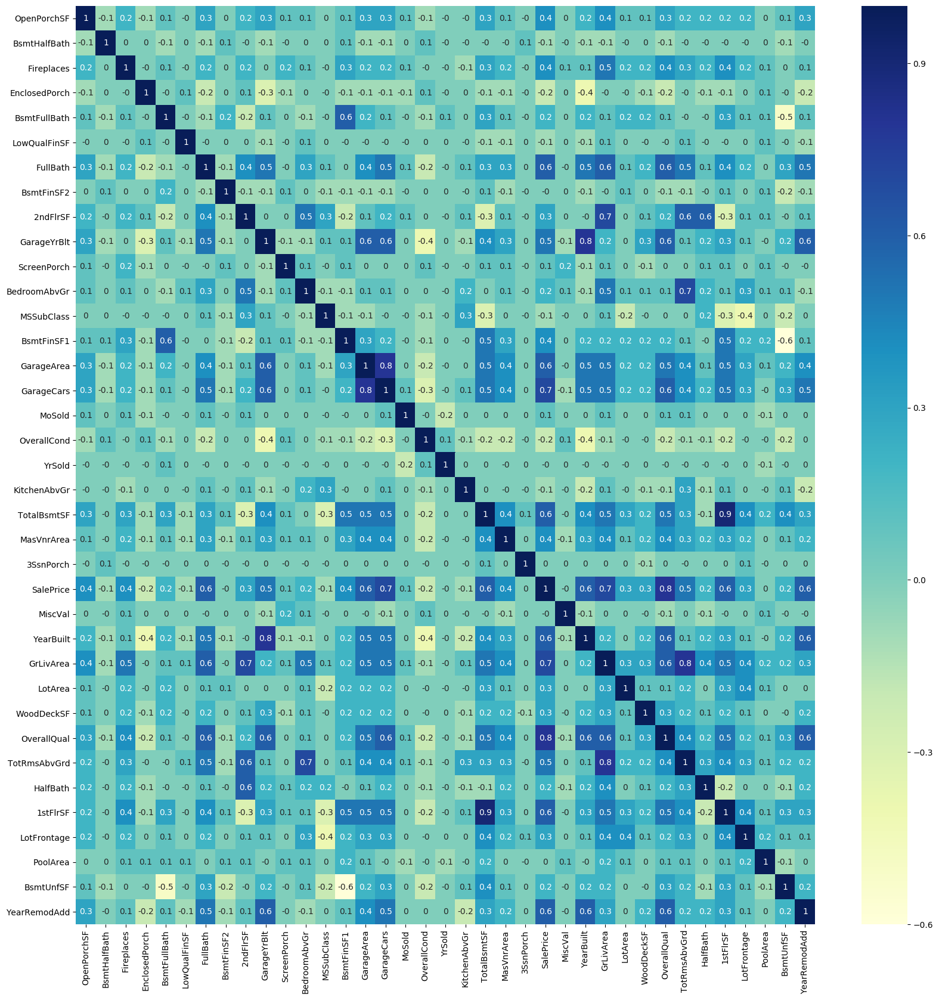

In [173]:
# plotting correlations on a heatmap

# figure size
plt.figure(figsize=(20,20))

# heatmap
sns.heatmap(round(cor, 1), cmap="YlGnBu", annot=True)
plt.show()

In [174]:
# Checking SalePrice dependencies
round(cor['SalePrice'].sort_values(ascending = False), 2)

SalePrice        1.00
OverallQual      0.81
GrLivArea        0.67
GarageCars       0.66
GarageArea       0.63
1stFlrSF         0.60
TotalBsmtSF      0.59
FullBath         0.57
YearBuilt        0.57
YearRemodAdd     0.56
GarageYrBlt      0.53
TotRmsAbvGrd     0.52
Fireplaces       0.45
MasVnrArea       0.44
OpenPorchSF      0.35
BsmtFinSF1       0.35
WoodDeckSF       0.34
LotFrontage      0.33
LotArea          0.28
2ndFlrSF         0.25
HalfBath         0.25
BsmtFullBath     0.24
BsmtUnfSF        0.19
BedroomAbvGr     0.15
MoSold           0.09
ScreenPorch      0.07
3SsnPorch        0.05
PoolArea         0.01
YrSold          -0.01
MiscVal         -0.03
BsmtFinSF2      -0.04
LowQualFinSF    -0.05
BsmtHalfBath    -0.07
MSSubClass      -0.10
KitchenAbvGr    -0.12
OverallCond     -0.15
EnclosedPorch   -0.17
Name: SalePrice, dtype: float64

**Top 5 proportionately impacting 'SalePrice'**
1. OverallQual      0.80
2. GrLivArea        0.71
3. GarageCars       0.65
4. GarageArea       0.62
5. TotalBsmtSF      0.62

**Top 5 inverse-proportionately imacting 'SalePrice'**
1. EnclosedPorch   -0.16
2. OverallCond     -0.14
3. KitchenAbvGr    -0.12
4. MSSubClass      -0.09
5. BsmtHalfBath    -0.04

In [175]:
# Data Preparation
df_input.columns

Index(['LandSlope', 'OpenPorchSF', 'ExterQual', 'BsmtHalfBath', 'Condition2',
       'Fireplaces', 'BsmtExposure', 'Heating', 'EnclosedPorch',
       'BsmtFullBath', 'GarageFinish', 'GarageType', 'LowQualFinSF',
       'FullBath', 'Condition1', 'BsmtFinSF2', '2ndFlrSF', 'GarageYrBlt',
       'SaleCondition', 'HeatingQC', 'ExterCond', 'ScreenPorch',
       'BedroomAbvGr', 'MSSubClass', 'BsmtFinSF1', 'GarageArea', 'LotShape',
       'LotConfig', 'BsmtCond', 'GarageCars', 'RoofMatl', 'PavedDrive',
       'Exterior1st', 'MoSold', 'GarageCond', 'OverallCond', 'YrSold',
       'GarageQual', 'Electrical', 'Foundation', 'HouseStyle', 'KitchenAbvGr',
       'BsmtFinType1', 'TotalBsmtSF', 'CentralAir', 'MasVnrType', 'MasVnrArea',
       'Functional', '3SsnPorch', 'LandContour', 'BldgType', 'SalePrice',
       'MiscVal', 'YearBuilt', 'RoofStyle', 'BsmtFinType2', 'GrLivArea',
       'Utilities', 'Exterior2nd', 'LotArea', 'SaleType', 'WoodDeckSF',
       'BsmtQual', 'MSZoning', 'OverallQual', 'TotR

In [0]:
# independent Cols 
independent_cols = list(set(df_input.columns) - set(['SalePrice']))

In [0]:
X = df_input[independent_cols]
y = df_input['SalePrice']

In [178]:
X.head()

,LandSlope,OpenPorchSF,ExterQual,BsmtHalfBath,Condition2,Fireplaces,BsmtExposure,Heating,EnclosedPorch,BsmtFullBath,GarageFinish,GarageType,LowQualFinSF,FullBath,Condition1,BsmtFinSF2,2ndFlrSF,GarageYrBlt,SaleCondition,HeatingQC,ExterCond,ScreenPorch,BedroomAbvGr,MSSubClass,BsmtFinSF1,GarageArea,LotShape,LotConfig,BsmtCond,GarageCars,RoofMatl,PavedDrive,Exterior1st,MoSold,GarageCond,OverallCond,YrSold,GarageQual,Electrical,Foundation,HouseStyle,KitchenAbvGr,BsmtFinType1,TotalBsmtSF,CentralAir,MasVnrType,MasVnrArea,Functional,3SsnPorch,LandContour,BldgType,MiscVal,YearBuilt,RoofStyle,BsmtFinType2,GrLivArea,Utilities,Exterior2nd,LotArea,SaleType,WoodDeckSF,BsmtQual,MSZoning,OverallQual,TotRmsAbvGrd,HalfBath,KitchenQual,1stFlrSF,LotFrontage,Neighborhood,PoolArea,BsmtUnfSF,YearRemodAdd,Street
0,Gtl,61,Gd,0,Norm,0,No,GasA,0,1,RFn,Attchd,0,2,Norm,0,854,2003.0,Normal,Ex,TA,0,3,60,706,548,Reg,Inside,TA,2,CompShg,Y,VinylSd,2,TA,5,2008,TA,SBrkr,PConc,2Story,1,GLQ,856,Y,BrkFace,196.0,Typ,0,Lvl,1Fam,0,2003,Gable,Unf,1710,AllPub,VinylSd,8450,WD,0,Gd,RL,7,8,1,Gd,856,65.0,CollgCr,0,150,2003,Pave
1,Gtl,0,TA,1,Norm,1,Gd,GasA,0,0,RFn,Attchd,0,2,Feedr,0,0,1976.0,Normal,Ex,TA,0,3,20,978,460,Reg,FR2,TA,2,CompShg,Y,MetalSd,5,TA,8,2007,TA,SBrkr,CBlock,1Story,1,ALQ,1262,Y,None,0.0,Typ,0,Lvl,1Fam,0,1976,Gable,Unf,1262,AllPub,MetalSd,9600,WD,298,Gd,RL,6,6,0,TA,1262,80.0,Veenker,0,284,1976,Pave
2,Gtl,42,Gd,0,Norm,1,Mn,GasA,0,1,RFn,Attchd,0,2,Norm,0,866,2001.0,Normal,Ex,TA,0,3,60,486,608,IR1,Inside,TA,2,CompShg,Y,VinylSd,9,TA,5,2008,TA,SBrkr,PConc,2Story,1,GLQ,920,Y,BrkFace,162.0,Typ,0,Lvl,1Fam,0,2001,Gable,Unf,1786,AllPub,VinylSd,11250,WD,0,Gd,RL,7,6,1,Gd,920,68.0,CollgCr,0,434,2002,Pave
3,Gtl,35,TA,0,Norm,1,No,GasA,272,1,Unf,Detchd,0,1,Norm,0,756,1998.0,Abnorml,Gd,TA,0,3,70,216,642,IR1,Corner,Gd,3,CompShg,Y,Wd Sdng,2,TA,5,2006,TA,SBrkr,BrkTil,2Story,1,ALQ,756,Y,None,0.0,Typ,0,Lvl,1Fam,0,1915,Gable,Unf,1717,AllPub,Wd Shng,9550,WD,0,TA,RL,7,7,0,Gd,961,60.0,Crawfor,0,540,1970,Pave
4,Gtl,84,Gd,0,Norm,1,Av,GasA,0,1,RFn,Attchd,0,2,Norm,0,1053,2000.0,Normal,Ex,TA,0,4,60,655,836,IR1,FR2,TA,3,CompShg,Y,VinylSd,12,TA,5,2008,TA,SBrkr,PConc,2Story,1,GLQ,1145,Y,BrkFace,350.0,Typ,0,Lvl,1Fam,0,2000,Gable,Unf,2198,AllPub,VinylSd,14260,WD,192,Gd,RL,8,9,1,Gd,1145,84.0,NoRidge,0,490,2000,Pave


In [179]:
y.head()

0    208500
1    181500
2    223500
3    140000
4    250000
Name: SalePrice, dtype: int64

In [180]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1083 entries, 0 to 1459
Data columns (total 74 columns):
LandSlope        1083 non-null object
OpenPorchSF      1083 non-null int64
ExterQual        1083 non-null object
BsmtHalfBath     1083 non-null int64
Condition2       1083 non-null object
Fireplaces       1083 non-null int64
BsmtExposure     1083 non-null object
Heating          1083 non-null object
EnclosedPorch    1083 non-null int64
BsmtFullBath     1083 non-null int64
GarageFinish     1083 non-null object
GarageType       1083 non-null object
LowQualFinSF     1083 non-null int64
FullBath         1083 non-null int64
Condition1       1083 non-null object
BsmtFinSF2       1083 non-null int64
2ndFlrSF         1083 non-null int64
GarageYrBlt      1083 non-null float64
SaleCondition    1083 non-null object
HeatingQC        1083 non-null object
ExterCond        1083 non-null object
ScreenPorch      1083 non-null int64
BedroomAbvGr     1083 non-null int64
MSSubClass       1083 non-nul

In [181]:
num_cols = X.describe().columns
non_num_cols = list(set(X.columns) - set(num_cols))

print("======= NUMERIC COLUMNS ======== \n{}".format(num_cols))
print("======= NON-NUMERIC COLUMNS ======== \n{}".format(non_num_cols))


======= NUMERIC COLUMNS ======== 
Index(['OpenPorchSF', 'BsmtHalfBath', 'Fireplaces', 'EnclosedPorch',
       'BsmtFullBath', 'LowQualFinSF', 'FullBath', 'BsmtFinSF2', '2ndFlrSF',
       'GarageYrBlt', 'ScreenPorch', 'BedroomAbvGr', 'MSSubClass',
       'BsmtFinSF1', 'GarageArea', 'GarageCars', 'MoSold', 'OverallCond',
       'YrSold', 'KitchenAbvGr', 'TotalBsmtSF', 'MasVnrArea', '3SsnPorch',
       'MiscVal', 'YearBuilt', 'GrLivArea', 'LotArea', 'WoodDeckSF',
       'OverallQual', 'TotRmsAbvGrd', 'HalfBath', '1stFlrSF', 'LotFrontage',
       'PoolArea', 'BsmtUnfSF', 'YearRemodAdd'],
      dtype='object')
======= NON-NUMERIC COLUMNS ======== 
['Electrical', 'LandSlope', 'Foundation', 'ExterQual', 'HouseStyle', 'Condition2', 'BsmtFinType1', 'BsmtExposure', 'CentralAir', 'Heating', 'MasVnrType', 'Functional', 'LandContour', 'GarageFinish', 'GarageType', 'BldgType', 'RoofStyle', 'BsmtFinType2', 'Condition1', 'SaleCondition', 'HeatingQC', 'ExterCond', 'Utilities', 'Exterior2nd', 'SaleType'

In [182]:
num_cols

Index(['OpenPorchSF', 'BsmtHalfBath', 'Fireplaces', 'EnclosedPorch',
       'BsmtFullBath', 'LowQualFinSF', 'FullBath', 'BsmtFinSF2', '2ndFlrSF',
       'GarageYrBlt', 'ScreenPorch', 'BedroomAbvGr', 'MSSubClass',
       'BsmtFinSF1', 'GarageArea', 'GarageCars', 'MoSold', 'OverallCond',
       'YrSold', 'KitchenAbvGr', 'TotalBsmtSF', 'MasVnrArea', '3SsnPorch',
       'MiscVal', 'YearBuilt', 'GrLivArea', 'LotArea', 'WoodDeckSF',
       'OverallQual', 'TotRmsAbvGrd', 'HalfBath', '1stFlrSF', 'LotFrontage',
       'PoolArea', 'BsmtUnfSF', 'YearRemodAdd'],
      dtype='object')

In [183]:
# checking whether Categoircals or not
for col in non_num_cols:
  print("\n", '------ VALUE COUNTS For COL: "{}" ---------'.format(col))
  print(X[col].value_counts())


 ------ VALUE COUNTS For COL: "Electrical" ---------
SBrkr    998
FuseA     67
FuseF     15
FuseP      2
Mix        1
Name: Electrical, dtype: int64

 ------ VALUE COUNTS For COL: "LandSlope" ---------
Gtl    1035
Mod      43
Sev       5
Name: LandSlope, dtype: int64

 ------ VALUE COUNTS For COL: "Foundation" ---------
PConc     508
CBlock    446
BrkTil    121
Stone       6
Wood        2
Name: Foundation, dtype: int64

 ------ VALUE COUNTS For COL: "ExterQual" ---------
TA    646
Gd    391
Ex     39
Fa      7
Name: ExterQual, dtype: int64

 ------ VALUE COUNTS For COL: "HouseStyle" ---------
1Story    537
2Story    339
1.5Fin    117
SLvl       43
SFoyer     23
1.5Unf     10
2.5Unf      9
2.5Fin      5
Name: HouseStyle, dtype: int64

 ------ VALUE COUNTS For COL: "Condition2" ---------
Norm      1071
Feedr        5
RRNn         2
Artery       2
PosN         2
PosA         1
Name: Condition2, dtype: int64

 ------ VALUE COUNTS For COL: "BsmtFinType1" ---------
Unf    340
GLQ    316
ALQ

In [184]:
# With a confirmation from above as they are categorical, creating dummy values for the same
X_cat_dummies = pd.get_dummies(X[non_num_cols], drop_first= True)
X_cat_dummies.head()

,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,LandSlope_Mod,LandSlope_Sev,Foundation_CBlock,Foundation_PConc,Foundation_Stone,Foundation_Wood,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRNn,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,CentralAir_Y,Heating_GasW,Heating_Grav,Heating_OthW,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,...,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,GarageCond_Fa,GarageCond_Gd,GarageCond_Po,GarageCond_TA,Street_Pave,GarageQual_Fa,GarageQual_Gd,GarageQual_Po,GarageQual_TA
0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,1,0,0,...,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1
1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,...,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,1
2,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,1,0,0,...,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1
3,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1
4,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1


In [0]:
# Dropping categoricals from X
X = X.drop(non_num_cols, axis = 1)

In [0]:
# Concatenating dummay values of Categoricals
X = pd.concat([X, X_cat_dummies], axis = 1)

In [187]:
X.head()

,OpenPorchSF,BsmtHalfBath,Fireplaces,EnclosedPorch,BsmtFullBath,LowQualFinSF,FullBath,BsmtFinSF2,2ndFlrSF,GarageYrBlt,ScreenPorch,BedroomAbvGr,MSSubClass,BsmtFinSF1,GarageArea,GarageCars,MoSold,OverallCond,YrSold,KitchenAbvGr,TotalBsmtSF,MasVnrArea,3SsnPorch,MiscVal,YearBuilt,GrLivArea,LotArea,WoodDeckSF,OverallQual,TotRmsAbvGrd,HalfBath,1stFlrSF,LotFrontage,PoolArea,BsmtUnfSF,YearRemodAdd,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,...,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,GarageCond_Fa,GarageCond_Gd,GarageCond_Po,GarageCond_TA,Street_Pave,GarageQual_Fa,GarageQual_Gd,GarageQual_Po,GarageQual_TA
0,61,0,0,0,1,0,2,0,854,2003.0,0,3,60,706,548,2,2,5,2008,1,856,196.0,0,0,2003,1710,8450,0,7,8,1,856,65.0,0,150,2003,0,0,0,1,...,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1
1,0,1,1,0,0,0,2,0,0,1976.0,0,3,20,978,460,2,5,8,2007,1,1262,0.0,0,0,1976,1262,9600,298,6,6,0,1262,80.0,0,284,1976,0,0,0,1,...,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,1
2,42,0,1,0,1,0,2,0,866,2001.0,0,3,60,486,608,2,9,5,2008,1,920,162.0,0,0,2001,1786,11250,0,7,6,1,920,68.0,0,434,2002,0,0,0,1,...,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1
3,35,0,1,272,1,0,1,0,756,1998.0,0,3,70,216,642,3,2,5,2006,1,756,0.0,0,0,1915,1717,9550,0,7,7,0,961,60.0,0,540,1970,0,0,0,1,...,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1
4,84,0,1,0,1,0,2,0,1053,2000.0,0,4,60,655,836,3,12,5,2008,1,1145,350.0,0,0,2000,2198,14260,192,8,9,1,1145,84.0,0,490,2000,0,0,0,1,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1


In [188]:
# now checking the data distribution
X.shape

(1083, 221)

# 3. Scaling the Features

In [189]:
# scaing features
from sklearn.preprocessing import scale

# Scaling and re-preparing the dataframe
cols = X.columns
X = pd.DataFrame(scale(X))
X.columns = cols
X.columns

Index(['OpenPorchSF', 'BsmtHalfBath', 'Fireplaces', 'EnclosedPorch',
       'BsmtFullBath', 'LowQualFinSF', 'FullBath', 'BsmtFinSF2', '2ndFlrSF',
       'GarageYrBlt',
       ...
       'Neighborhood_Veenker', 'GarageCond_Fa', 'GarageCond_Gd',
       'GarageCond_Po', 'GarageCond_TA', 'Street_Pave', 'GarageQual_Fa',
       'GarageQual_Gd', 'GarageQual_Po', 'GarageQual_TA'],
      dtype='object', length=221)

In [190]:
X.describe()

,OpenPorchSF,BsmtHalfBath,Fireplaces,EnclosedPorch,BsmtFullBath,LowQualFinSF,FullBath,BsmtFinSF2,2ndFlrSF,GarageYrBlt,ScreenPorch,BedroomAbvGr,MSSubClass,BsmtFinSF1,GarageArea,GarageCars,MoSold,OverallCond,YrSold,KitchenAbvGr,TotalBsmtSF,MasVnrArea,3SsnPorch,MiscVal,YearBuilt,GrLivArea,LotArea,WoodDeckSF,OverallQual,TotRmsAbvGrd,HalfBath,1stFlrSF,LotFrontage,PoolArea,BsmtUnfSF,YearRemodAdd,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,...,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,GarageCond_Fa,GarageCond_Gd,GarageCond_Po,GarageCond_TA,Street_Pave,GarageQual_Fa,GarageQual_Gd,GarageQual_Po,GarageQual_TA
count,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,...,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03,1.083000e+03
mean,-2.373191e-17,5.807399e-17,-1.691476e-16,1.882664e-16,-3.321443e-17,1.474403e-16,4.838645e-17,-1.051790e-16,1.707878e-16,1.648112e-15,4.149753e-16,4.892465e-16,-1.125600e-16,-8.816175e-17,3.485465e-18,1.980564e-16,1.273732e-16,-8.816175e-17,-4.260519e-14,8.097042e-16,1.706340e-16,-2.052324e-16,6.813315e-16,-4.695639e-16,-2.061140e-15,1.177882e-16,3.452308e-17,2.419323e-16,1.164555e-16,-2.157913e-16,1.308074e-16,9.610656e-17,-1.502338e-16,-5.082628e-16,-4.592612e-17,1.460512e-15,-1.191209e-16,5.888513e-16,-1.394827e-17,2.249150e-16,...,2.160476e-16,-2.295281e-16,-8.858462e-17,-2.272215e-16,1.404437e-16,-1.559233e-16,3.300940e-17,3.723296e-16,5.722826e-17,-1.363944e-16,-7.315632e-16,-3.482389e-16,-1.521303e-16,2.694059e-16,3.458299e-16,-7.806416e-17,2.526193e-16,-4.127200e-16,-1.989790e-16,5.617749e-17,4.080557e-16,1.777587e-16,1.024214e-15,2.047198e-16,3.690492e-18,-1.857035e-16,-1.446980e-16,6.325093e-17,-1.976464e-16,-3.147682e-16,7.421990e-17,1.987227e-16,1.283215e-16,6.504492e-17,-1.706340e-16,-7.612024e-16,-2.978022e-16,9.538897e-17,-1.042564e-16,2.603335e-16
std,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,...,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1.000462e+00,1

In [191]:
y.head()

0    208500
1    181500
2    223500
3    140000
4    250000
Name: SalePrice, dtype: int64

In [0]:
# Mapping into Train and Test splits
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    train_size=0.7,
                                                    test_size = 0.3, random_state=85)

# 4. Model building And Evaluation

## 4.1 Ridge Regression

In [0]:
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV

In [194]:
# list of alphas to tune
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}


ridge = Ridge()

# cross validation
folds = 5
model_cv = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
model_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 140 out of 140 | elapsed:    3.3s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=Ridge(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=None, normalize=False, random_state=None,
                             solver='auto', tol=0.001),
             iid='warn', n_jobs=None,
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='neg_mean_absolute_error', verbose=1)

In [195]:
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results = cv_results[cv_results['param_alpha']<=200]
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.010517,0.002733,0.002591,0.000597,0.0001,{'alpha': 0.0001},-15141.362500,-17797.715443,-18826.845633,-18769.549421,-18020.906752,-17709.471327,1348.194181,27,-10773.693539,-10368.650064,-10336.584801,-10158.699276,-9902.675870,-10308.060710,285.637649
1,0.009339,0.000146,0.002007,0.000126,0.001,{'alpha': 0.001},-15141.071580,-17797.602654,-18826.444955,-18765.425343,-18020.547488,-17708.416905,1347.575451,26,-10773.722263,-10368.677980,-10336.599879,-10158.842977,-9902.700829,-10308.108786,285.626390
2,0.011036,0.003993,0.002315,0.000765,0.01,{'alpha': 0.01},-15138.167995,-17796.463149,-18822.554171,-18725.001775,-18019.645663,-17698.593576,1341.738558,25,-10774.008854,-10368.953628,-10336.746829,-10160.256989,-9902.948562,-10308.582973,285.516704
3,0.009047,0.000333,0.001823,0.000050,0.05,{'alpha': 0.05},-15125.381200,-17791.175033,-18807.381287,-18561.567457,-18015.589078,-17658.560870,1320.150937,24,-10775.328326,-10370.129392,-10337.330165,-10166.300743,-9904.057914,-10310.629308,285.071713
4,0.012549,0.004989,0.003049,0.000976,0.1,{'alpha': 0.1},-15109.850872,-17784.172664,-18791.873739,-18387.987953,-18010.427987,-17615.326112,1300.815246,23,-10777.050791,-10371.460883,-10337.971961,-10173.214337,-9905.522593,-10313.044113,284.591732


In [196]:
cv_results_1 = pd.DataFrame(model_cv.cv_results_)

cv_results_1.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.010517,0.002733,0.002591,0.000597,0.0001,{'alpha': 0.0001},-15141.362500,-17797.715443,-18826.845633,-18769.549421,-18020.906752,-17709.471327,1348.194181,27,-10773.693539,-10368.650064,-10336.584801,-10158.699276,-9902.675870,-10308.060710,285.637649
1,0.009339,0.000146,0.002007,0.000126,0.001,{'alpha': 0.001},-15141.071580,-17797.602654,-18826.444955,-18765.425343,-18020.547488,-17708.416905,1347.575451,26,-10773.722263,-10368.677980,-10336.599879,-10158.842977,-9902.700829,-10308.108786,285.626390
2,0.011036,0.003993,0.002315,0.000765,0.01,{'alpha': 0.01},-15138.167995,-17796.463149,-18822.554171,-18725.001775,-18019.645663,-17698.593576,1341.738558,25,-10774.008854,-10368.953628,-10336.746829,-10160.256989,-9902.948562,-10308.582973,285.516704
3,0.009047,0.000333,0.001823,0.000050,0.05,{'alpha': 0.05},-15125.381200,-17791.175033,-18807.381287,-18561.567457,-18015.589078,-17658.560870,1320.150937,24,-10775.328326,-10370.129392,-10337.330165,-10166.300743,-9904.057914,-10310.629308,285.071713
4,0.012549,0.004989,0.003049,0.000976,0.1,{'alpha': 0.1},-15109.850872,-17784.172664,-18791.873739,-18387.987953,-18010.427987,-17615.326112,1300.815246,23,-10777.050791,-10371.460883,-10337.971961,-10173.214337,-9905.522593,-10313.044113,284.591732


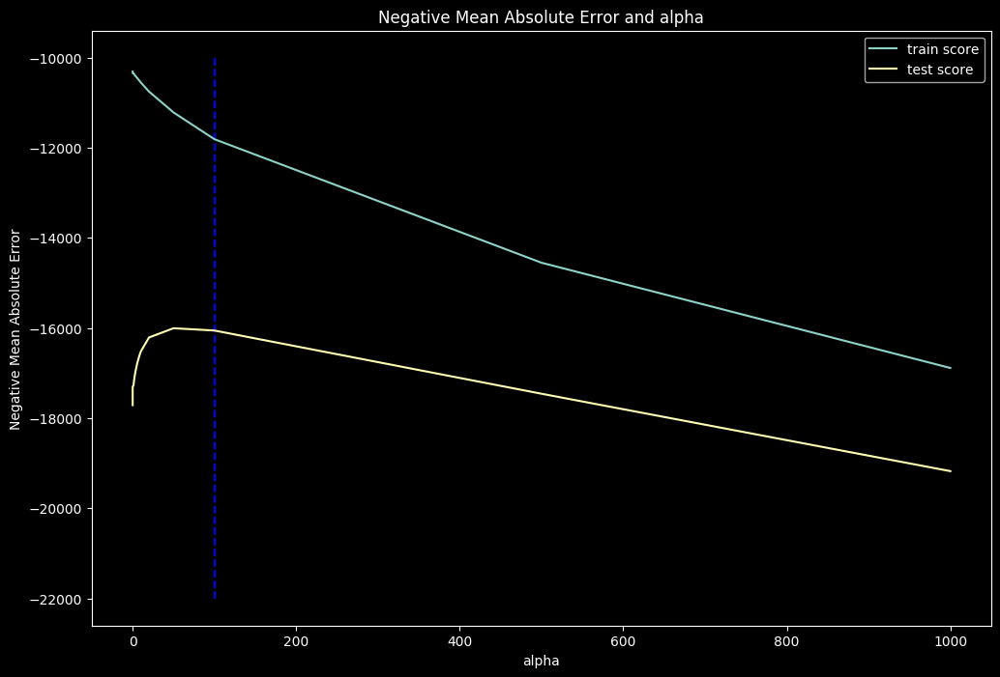

In [241]:
# plotting mean test and train scoes with alpha 
cv_results_1['param_alpha'] = cv_results_1['param_alpha'].astype('int32')

# plotting
plt.style.use('dark_background')
plt.figure(figsize = (12, 8))
plt.plot(cv_results_1['param_alpha'], cv_results_1['mean_train_score'])
plt.plot(cv_results_1['param_alpha'], cv_results_1['mean_test_score'])
plt.vlines(100, ymin = -22000, ymax = -10000, linestyles= '--', colors = 'b')
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'], loc='upper right')
plt.show()

Looking at the above plot, neg. mean absolute error gradually decreasing for alpha value around 100; whereas test score is maintaining steady value. So, we are choosing **alpha = 100**, considering we have stable values.

In [225]:
alpha = 100
ridge = Ridge(alpha=alpha)

ridge.fit(X_train, y_train)
ridge.coef_

array([ 2.16130681e+03, -2.42634560e+02,  2.53470109e+03,  1.04134501e+02,
        2.65093216e+03, -5.27568124e+02,  2.09529191e+03, -3.67949898e+02,
        4.69122731e+03, -8.23126350e+02,  1.18913366e+03, -7.30659866e+02,
       -2.78616520e+03,  6.33327182e+03,  3.60286820e+03,  3.68770190e+03,
        3.54700619e+02,  4.36747685e+03,  6.32975638e+02, -2.58217979e+03,
        7.39002842e+03,  2.41011521e+03,  2.47713806e+03,  1.07243562e+02,
        3.39542332e+03,  9.26600188e+03,  5.77809660e+03,  3.16096327e+03,
        9.56176871e+03,  2.82336230e+03,  2.97042537e+03,  6.89366221e+03,
        1.69457612e+03,  8.36969732e+02,  3.08412855e+02,  2.79361701e+03,
        6.08346495e+02,  2.35136977e+01, -1.46362604e+02,  2.08320437e+02,
        1.48876748e+02, -3.57479233e+03,  8.60065471e+02,  1.83048180e+03,
        5.96150006e+01, -1.68971312e+03, -1.08468924e+02, -3.41094238e+03,
       -4.98770499e+03, -2.66146950e+02, -2.62856675e+02, -7.89141144e+02,
       -4.17242458e+02,  

In [226]:
# checking and finding predicting values with Ridge
y_train_pred_ridge = ridge.predict(X_train)
print('Train Data Prediction - R2-score')
print(metrics.r2_score(y_true = y_train, y_pred = y_train_pred_ridge))

print("\n", 'Test Data Prediction - R2-Score')
y_test_pred_ridge = ridge.predict(X_test)
print(metrics.r2_score(y_true = y_test, y_pred = y_test_pred_ridge))

Train Data Prediction - R2-score
0.9442703888144303

 Test Data Prediction - R2-Score
0.6761510725301554


In [201]:
# Ridge Model Parameters
model_parameters = list(ridge.coef_)
model_parameters.insert(0, ridge.intercept_)
model_parameters = [round(x, 3) for x in model_parameters]
cols = X.columns
cols = cols.insert(0, "constant")
list(zip(cols, model_parameters))

[('constant', 183338.878),
 ('OpenPorchSF', 2094.906),
 ('BsmtHalfBath', -116.219),
 ('Fireplaces', 2040.854),
 ('EnclosedPorch', 105.223),
 ('BsmtFullBath', 2531.431),
 ('LowQualFinSF', -499.409),
 ('FullBath', 1996.791),
 ('BsmtFinSF2', -395.183),
 ('2ndFlrSF', 6051.557),
 ('GarageYrBlt', -1499.649),
 ('ScreenPorch', 1260.835),
 ('BedroomAbvGr', -1072.126),
 ('MSSubClass', -3061.103),
 ('BsmtFinSF1', 6990.881),
 ('GarageArea', 3358.513),
 ('GarageCars', 3598.646),
 ('MoSold', 381.833),
 ('OverallCond', 5024.358),
 ('YrSold', 569.512),
 ('KitchenAbvGr', -2661.265),
 ('TotalBsmtSF', 8092.75),
 ('MasVnrArea', 2072.287),
 ('3SsnPorch', 2588.57),
 ('MiscVal', 114.487),
 ('YearBuilt', 4735.783),
 ('GrLivArea', 10734.542),
 ('LotArea', 6688.417),
 ('WoodDeckSF', 3066.685),
 ('OverallQual', 10006.443),
 ('TotRmsAbvGrd', 1988.256),
 ('HalfBath', 3059.291),
 ('1stFlrSF', 7275.198),
 ('LotFrontage', 1286.15),
 ('PoolArea', 879.182),
 ('BsmtUnfSF', 277.643),
 ('YearRemodAdd', 2486.357),
 ('Elect

In [202]:
# Making data frame using Ridge parameters
ridge_results = pd.DataFrame({'Feature': cols, 'ridge_param_value': model_parameters})
ridge_results.head()

,Feature,ridge_param_value
0,constant,183338.878
1,OpenPorchSF,2094.906
2,BsmtHalfBath,-116.219
3,Fireplaces,2040.854
4,EnclosedPorch,105.223


In [203]:
ridge_results.sort_values(by = 'ridge_param_value', ascending= False)

,Feature,ridge_param_value
0,constant,183338.878
26,GrLivArea,10734.542
29,OverallQual,10006.443
21,TotalBsmtSF,8092.750
32,1stFlrSF,7275.198
204,Neighborhood_NridgHt,7079.903
14,BsmtFinSF1,6990.881
27,LotArea,6688.417
9,2ndFlrSF,6051.557
210,Neighborhood_StoneBr,5396.653


Conclusion from Ridge Regression:
-----------------------------------

Top 5 highly impacting SalePrice features are:
1.	GrLivArea
2.	OverallQual
3.	TotalBsmtSF
4.	1stFlrSF
5.	Neighborhood_NridgHt

## 4.2 Lasso Regression

In [204]:
y_train.head()

808     159950
144     125000
1295    138500
561     170000
1249    119000
Name: SalePrice, dtype: int64

In [0]:
import warnings
warnings.filterwarnings('ignore')

In [206]:
lasso = Lasso()

# cross validation
# model_cv = GridSearchCV(estimator = lasso, 
#                         param_grid = params, 
#                         scoring= 'r2', 
#                         cv = folds, 
#                         return_train_score=True,
#                         verbose = 1)        

model_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)     
    

model_cv.fit(X_train, y_train)

Fitting 5 folds for each of 28 candidates, totalling 140 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 140 out of 140 | elapsed:   22.9s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=1000, normalize=False, positive=False,
                             precompute=False, random_state=None,
                             selection='cyclic', tol=0.0001, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='neg_mean_absolute_error', verbose=1)

In [207]:
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.185455,0.023165,0.004621,0.002281,0.0001,{'alpha': 0.0001},-15184.812475,-17815.828034,-18844.513459,-18323.282979,-18021.165127,-17636.510643,1275.868904,28,-10773.600905,-10370.879902,-10337.576364,-10172.653289,-9902.835458,-10311.509184,284.263368
1,0.186214,0.025163,0.004422,0.001921,0.001,{'alpha': 0.001},-15184.670687,-17815.787597,-18844.223980,-18323.160178,-18021.151034,-17636.388783,1275.853428,27,-10773.604613,-10370.879015,-10337.577421,-10172.658157,-9902.834114,-10311.510664,284.264467
2,0.170206,0.025360,0.004557,0.002196,0.01,{'alpha': 0.01},-15183.252803,-17815.383173,-18841.329192,-18321.932163,-18021.010109,-17635.170170,1275.699064,26,-10773.646128,-10370.873534,-10337.588984,-10172.707413,-9902.825706,-10311.528353,284.275554
3,0.171621,0.011276,0.003615,0.001916,0.05,{'alpha': 0.05},-15176.951208,-17814.056503,-18828.462398,-18316.475022,-18020.383802,-17629.848468,1275.035112,25,-10773.838383,-10370.859776,-10337.644127,-10172.929772,-9902.823961,-10311.619204,284.317295
4,0.188504,0.020812,0.004502,0.002106,0.1,{'alpha': 0.1},-15169.074479,-17813.497867,-18812.327152,-18309.654240,-18019.565449,-17623.399600,1274.246785,24,-10774.097519,-10370.845446,-10337.720630,-10173.212171,-9902.899087,-10311.754970,284.353221


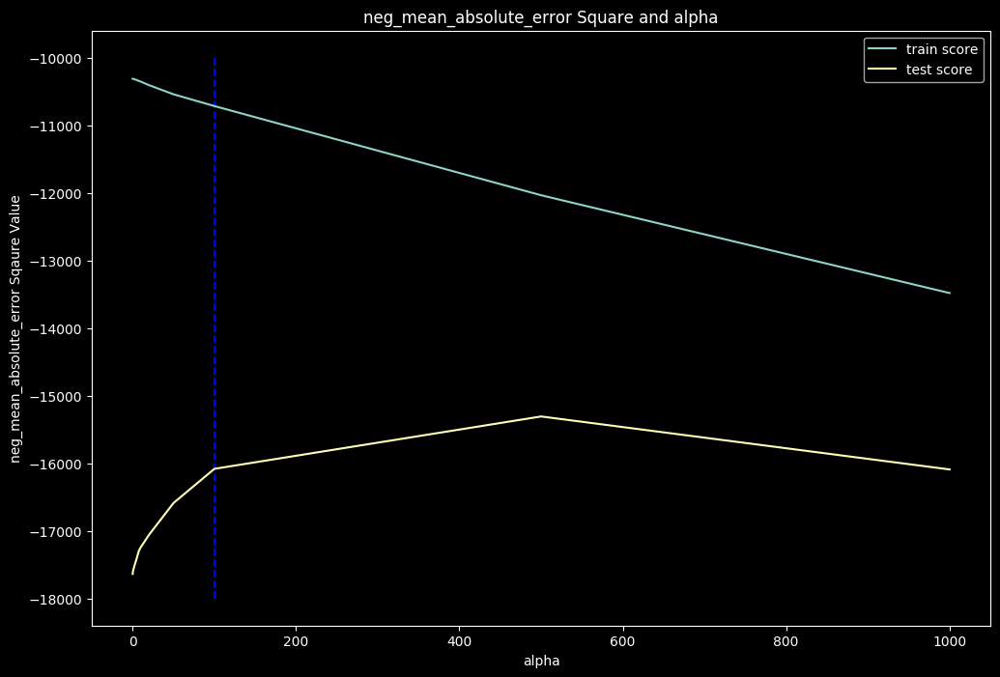

In [232]:
# plotting mean test and train scoes with alpha 
cv_results['param_alpha'] = cv_results['param_alpha'].astype('float32')

# plotting
plt.figure(figsize = (12, 8))
plt.vlines(100, ymin = -18000, ymax = -10000, linestyles= '--', colors = 'b')
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('neg_mean_absolute_error Sqaure Value')

plt.title("neg_mean_absolute_error Square and alpha")
plt.legend(['train score', 'test score'], loc='upper right')
plt.show()

In [209]:
alpha = 100
lasso = Lasso(alpha= alpha)
lasso.fit(X_train, y_train)

Lasso(alpha=100, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)

In [210]:
lasso.coef_

array([ 1.80038614e+03, -2.56637593e+01,  1.13631767e+03,  1.35651592e+02,
        2.05421829e+03, -1.29486862e+03,  4.75940633e+02,  0.00000000e+00,
        0.00000000e+00, -1.72020500e+03,  1.38418450e+03, -1.41251448e+03,
       -3.54303890e+03,  7.81115309e+03,  2.87724766e+03,  3.29413129e+03,
        3.17198186e+02,  6.29325500e+03,  1.72213117e+02, -2.63287477e+03,
        8.43563672e+03,  1.11317556e+03,  2.37106252e+03, -0.00000000e+00,
        9.34365486e+03,  2.56690169e+04,  8.14558456e+03,  2.68310145e+03,
        9.87993361e+03,  0.00000000e+00,  2.19682464e+03,  0.00000000e+00,
        8.73116642e+02,  6.35606205e+02, -0.00000000e+00,  1.77396457e+03,
        7.75466338e+02, -0.00000000e+00, -6.71361343e+01,  0.00000000e+00,
        0.00000000e+00, -5.40257718e+03,  1.30990243e+03,  2.15451978e+03,
        0.00000000e+00, -2.04091215e+03, -1.07947597e+03, -1.09650802e+04,
       -1.27321296e+04, -2.09438094e+01,  8.28717721e+02, -9.41060178e+02,
       -7.00265168e+02,  

In [211]:
from sklearn import metrics
# prediction Using Lasso model
y_train_pred_lasso = lasso.predict(X_train)
print('Train Data Prediction - R2-score')
print(metrics.r2_score(y_true = y_train, y_pred = y_train_pred_lasso))

print("\n", 'Test Data Prediction - R2-Score')
y_test_pred_lasso = lasso.predict(X_test)
print(metrics.r2_score(y_true = y_test, y_pred = y_test_pred_lasso))


Train Data Prediction - R2-score
0.9513000213694689

 Test Data Prediction - R2-Score
0.581875824859023


In [212]:
# lasso model parameters
model_parameters = list(lasso.coef_)
model_parameters.insert(0, lasso.intercept_)
model_parameters = [round(x, 3) for x in model_parameters]
cols = X.columns
cols = cols.insert(0, "constant")
list(zip(cols, model_parameters))

[('constant', 183358.03),
 ('OpenPorchSF', 1800.386),
 ('BsmtHalfBath', -25.664),
 ('Fireplaces', 1136.318),
 ('EnclosedPorch', 135.652),
 ('BsmtFullBath', 2054.218),
 ('LowQualFinSF', -1294.869),
 ('FullBath', 475.941),
 ('BsmtFinSF2', 0.0),
 ('2ndFlrSF', 0.0),
 ('GarageYrBlt', -1720.205),
 ('ScreenPorch', 1384.184),
 ('BedroomAbvGr', -1412.514),
 ('MSSubClass', -3543.039),
 ('BsmtFinSF1', 7811.153),
 ('GarageArea', 2877.248),
 ('GarageCars', 3294.131),
 ('MoSold', 317.198),
 ('OverallCond', 6293.255),
 ('YrSold', 172.213),
 ('KitchenAbvGr', -2632.875),
 ('TotalBsmtSF', 8435.637),
 ('MasVnrArea', 1113.176),
 ('3SsnPorch', 2371.063),
 ('MiscVal', -0.0),
 ('YearBuilt', 9343.655),
 ('GrLivArea', 25669.017),
 ('LotArea', 8145.585),
 ('WoodDeckSF', 2683.101),
 ('OverallQual', 9879.934),
 ('TotRmsAbvGrd', 0.0),
 ('HalfBath', 2196.825),
 ('1stFlrSF', 0.0),
 ('LotFrontage', 873.117),
 ('PoolArea', 635.606),
 ('BsmtUnfSF', -0.0),
 ('YearRemodAdd', 1773.965),
 ('Electrical_FuseF', 775.466),
 ('

In [213]:
lasso.intercept_

183358.03029447998

In [214]:
# list(zip(cols, model_parameters))

lasso_results = pd.DataFrame({'Feature': cols, 'lasso_param_value': model_parameters})
lasso_results.head()

,Feature,lasso_param_value
0,constant,183358.030
1,OpenPorchSF,1800.386
2,BsmtHalfBath,-25.664
3,Fireplaces,1136.318
4,EnclosedPorch,135.652


In [215]:
lasso_results.sort_values(by = 'lasso_param_value', ascending= False)

,Feature,lasso_param_value
0,constant,183358.030
26,GrLivArea,25669.017
29,OverallQual,9879.934
25,YearBuilt,9343.655
21,TotalBsmtSF,8435.637
27,LotArea,8145.585
14,BsmtFinSF1,7811.153
204,Neighborhood_NridgHt,6898.424
18,OverallCond,6293.255
210,Neighborhood_StoneBr,5697.842


Conclusion from Lasso regression:
-------------------------------------

Top 5 Highly impacting salePrice features are:
1.	GrLivArea
2.	OverallQual
3.	YearBuilt
4.	TotalBsmtSF
5.	LotArea